In [1]:
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from datetime import datetime
import matplotlib.dates as mdates
import pandas as pd
%matplotlib inline

In [24]:
# Load the CSV file into a DataFrame
file_path_csv = './地震活動彙整_20240427_0923.csv'
earthquake_data_df = pd.read_csv(file_path_csv, encoding='utf-8')

# Display the first few rows of the DataFrame to understand its structure
earthquake_data_df.head()

,編號,地震時間,經度,緯度,規模,深度,位置
0,356,2024-04-27 09:06:27,121.698,24.2152,4.6,10.3,花蓮縣政府北北東方 26.1 公里 (位於花蓮縣近海)(花蓮縣近海)
1,小區域有感地震,2024-04-27 07:37:13,121.642,24.2260,3.6,31.6,花蓮縣政府北方 26.1 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
2,小區域有感地震,2024-04-27 05:52:34,121.781,23.9503,4.0,20.8,花蓮縣政府東南東方 17.0 公里 (位於臺灣東部海域)(臺灣東部海域)
3,小區域有感地震,2024-04-27 04:08:16,122.001,24.1225,4.5,9.1,花蓮縣政府東北東方 41.4 公里 (位於臺灣東部海域)(臺灣東部海域)
4,小區域有感地震,2024-04-27 03:50:40,121.644,24.1855,3.5,33.5,花蓮縣政府北方 21.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)


In [25]:
earthquake_data_df=earthquake_data_df[earthquake_data_df['位置'].str.startswith('花')]

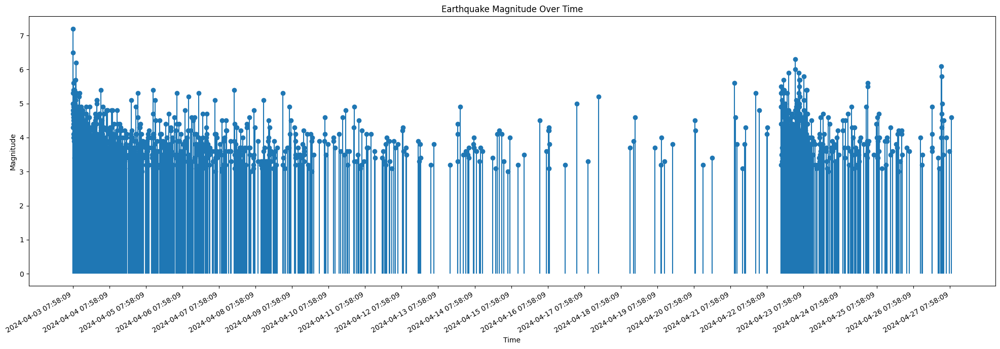

In [26]:
# Convert the '地震時間' column to datetime objects
earthquake_data_df['地震時間'] = pd.to_datetime(earthquake_data_df['地震時間'])


# Sort the DataFrame based on the '地震時間' to ensure it's in chronological order
earthquake_data_df.sort_values('地震時間', inplace=True)

# Create the stem plot
fig, ax = plt.subplots(figsize=(20, 7))
ax.stem(earthquake_data_df['地震時間'], earthquake_data_df['規模'], basefmt=" ")

# Set the x-axis to display dates correctly
ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M:%S'))
plt.gcf().autofmt_xdate() # Rotate date labels to avoid overlap

# Labels and title
plt.title('Earthquake Magnitude Over Time')
plt.xlabel('Time')
plt.ylabel('Magnitude')

# Generate a date range for x-ticks from the first to the last date
date_range = pd.date_range(start=earthquake_data_df['地震時間'].min(), end=earthquake_data_df['地震時間'].max(), freq='D')
ax.set_xticks(date_range)

plt.tight_layout() # Adjust the padding between and around subplots.


# Show the plot
plt.show()



In [27]:
# Set the '地震時間' column as the index to make it easier to resample by hour
Timed_earthquakes = earthquake_data_df.set_index('地震時間', inplace=False)

In [28]:
earthquake_data_df

,編號,地震時間,經度,緯度,規模,深度,位置
1350,19,2024-04-03 07:58:09,121.665,23.7690,7.2,15.5,花蓮縣政府南南東方 25.0 公里 (位於臺灣東部海域)(臺灣東部海域)
1349,20,2024-04-03 08:00:18,121.670,23.8712,5.3,25.4,花蓮縣政府南南東方 14.2 公里 (位於花蓮縣近海)(花蓮縣近海)
1348,小區域有感地震,2024-04-03 08:01:51,121.601,23.9920,5.0,39.7,花蓮縣政府西方 2.0 公里 (位於花蓮縣花蓮市)(花蓮縣花蓮市)
1347,小區域有感地震,2024-04-03 08:02:23,121.659,24.1727,5.0,33.3,花蓮縣政府北北東方 20.5 公里 (位於花蓮縣近海)(花蓮縣近海)
1346,小區域有感地震,2024-04-03 08:03:47,121.653,23.9513,4.8,34.5,花蓮縣政府東南方 5.5 公里 (位於花蓮縣近海)(花蓮縣近海)
...,...,...,...,...,...,...,...
4,小區域有感地震,2024-04-27 03:50:40,121.644,24.1855,3.5,33.5,花蓮縣政府北方 21.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
3,小區域有感地震,2024-04-27 04:08:16,122.001,24.1225,4.5,9.1,花蓮縣政府東北東方 41.4 公里 (位於臺灣東部海域)(臺灣東部海域)
2,小區域有感地震,2024-04-27 05:52:34,121.781,23.9503,4.0,20.8,花蓮縣政府東南東方 17.0 公里 (位於臺灣東部海域)(臺灣東部海域)
1,小區域有感地震,2024-04-27 07:37:13,121.642,24.2260,3.6,31.6,花蓮縣政府北方 26.1 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)


In [29]:
Timed_earthquakes

,編號,經度,緯度,規模,深度,位置
地震時間,,,,,,
2024-04-03 07:58:09,19,121.665,23.7690,7.2,15.5,花蓮縣政府南南東方 25.0 公里 (位於臺灣東部海域)(臺灣東部海域)
2024-04-03 08:00:18,20,121.670,23.8712,5.3,25.4,花蓮縣政府南南東方 14.2 公里 (位於花蓮縣近海)(花蓮縣近海)
2024-04-03 08:01:51,小區域有感地震,121.601,23.9920,5.0,39.7,花蓮縣政府西方 2.0 公里 (位於花蓮縣花蓮市)(花蓮縣花蓮市)
2024-04-03 08:02:23,小區域有感地震,121.659,24.1727,5.0,33.3,花蓮縣政府北北東方 20.5 公里 (位於花蓮縣近海)(花蓮縣近海)
2024-04-03 08:03:47,小區域有感地震,121.653,23.9513,4.8,34.5,花蓮縣政府東南方 5.5 公里 (位於花蓮縣近海)(花蓮縣近海)
...,...,...,...,...,...,...
2024-04-27 03:50:40,小區域有感地震,121.644,24.1855,3.5,33.5,花蓮縣政府北方 21.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
2024-04-27 04:08:16,小區域有感地震,122.001,24.1225,4.5,9.1,花蓮縣政府東北東方 41.4 公里 (位於臺灣東部海域)(臺灣東部海域)
2024-04-27 05:52:34,小區域有感地震,121.781,23.9503,4.0,20.8,花蓮縣政府東南東方 17.0 公里 (位於臺灣東部海域)(臺灣東部海域)


/var/folders/2m/wmhx4p3j2nl2tb_z521x4qwr0000gn/T/ipykernel_15052/1448324803.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  earthquakes_per_hour = Timed_earthquakes.resample('6H').size()


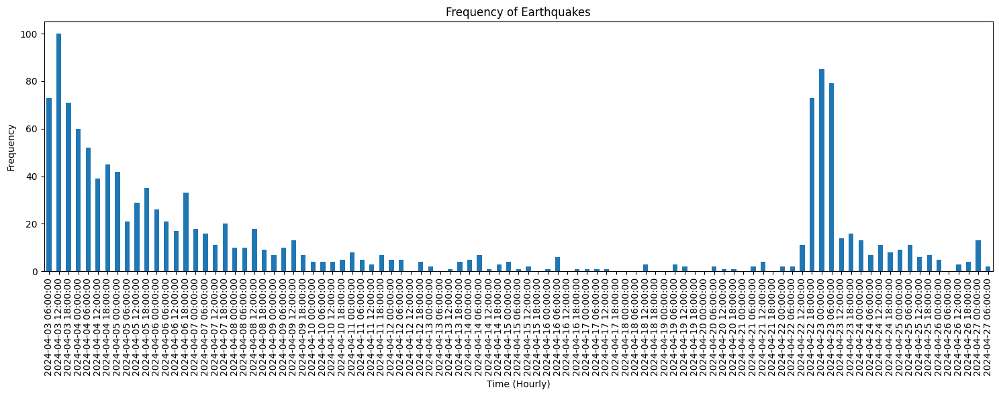

In [30]:
# Resample the data to get the count of earthquakes per hour
earthquakes_per_hour = Timed_earthquakes.resample('6H').size()

# Plot the frequency of earthquakes per hour
fig, ax = plt.subplots(figsize=(15, 6))
earthquakes_per_hour.plot(kind='bar', ax=ax)

# Labels and title
ax.set_title('Frequency of Earthquakes')
ax.set_xlabel('Time (Hourly)')
ax.set_ylabel('Frequency')

plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

plt.tight_layout();
plt.show();

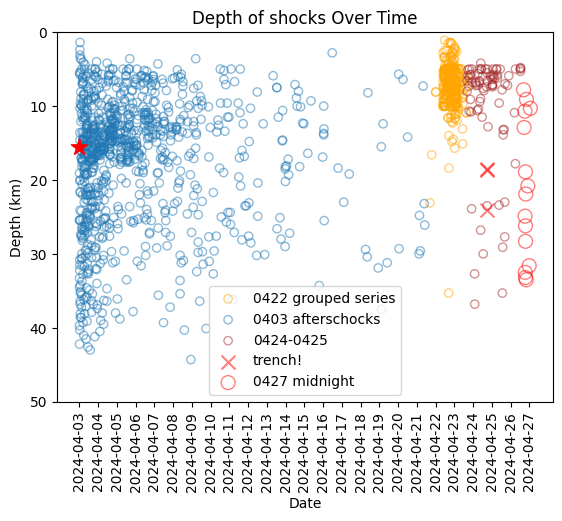

In [32]:
main_quake = earthquake_data_df[earthquake_data_df['規模']==7.2]
sub_main_quake= earthquake_data_df[earthquake_data_df['規模']==6]
sub_main_sub=earthquake_data_df[earthquake_data_df['規模']==6.3]

unknown_new_series = earthquake_data_df[
    (earthquake_data_df['地震時間'].dt.date == pd.to_datetime('2024-04-22').date()) | 
    (earthquake_data_df['地震時間'].dt.date == pd.to_datetime('2024-04-23').date()) 
]
latest_series=earthquake_data_df[ 
    (earthquake_data_df['地震時間'].dt.date == pd.to_datetime('2024-04-24').date()) | 
    (earthquake_data_df['地震時間'].dt.date == pd.to_datetime('2024-04-25').date()) | 
    (earthquake_data_df['地震時間'].dt.date == pd.to_datetime('2024-04-26').date())
]

twenty_seven=earthquake_data_df[earthquake_data_df['地震時間'].dt.date == pd.to_datetime('2024-04-27').date()]

risk_signals=latest_series[latest_series['經度']>122.0]
latest_series=latest_series.drop(risk_signals.index)

known_series = earthquake_data_df.drop(unknown_new_series.index)
known_series = known_series.drop(main_quake.index)
known_series=known_series.drop(latest_series.index)
known_series=known_series.drop(risk_signals.index)
known_series=known_series.drop(twenty_seven.index)


plt.scatter(unknown_new_series['地震時間'],unknown_new_series['深度'], edgecolors='orange', facecolors='none', alpha=0.5, label='0422 grouped series')
plt.scatter(known_series['地震時間'],known_series['深度'],edgecolors='#1f77b4', facecolors='none', alpha=0.5, label='0403 afterschocks')
plt.scatter(main_quake['地震時間'], main_quake['深度'], marker='*', color='red', alpha=1, s=150)
plt.scatter(latest_series['地震時間'],latest_series['深度'],edgecolors='brown', facecolors='none', alpha=0.5,label='0424-0425')
plt.scatter(risk_signals['地震時間'],risk_signals['深度'], marker='x', alpha=0.5, color='red',s=100, label='trench!')
plt.scatter(twenty_seven['地震時間'],twenty_seven['深度'], edgecolors='red', facecolors='none', alpha=0.5,s=100, label='0427 midnight')

plt.title('Depth of shocks Over Time')
plt.xlabel('Date')
plt.ylabel('Depth (km)')
plt.ylim(50,0)
plt.legend();
date_range = pd.date_range(start=earthquake_data_df['地震時間'].min(), end=earthquake_data_df['地震時間'].max(), freq='D');
plt.xticks(date_range, rotation=90);

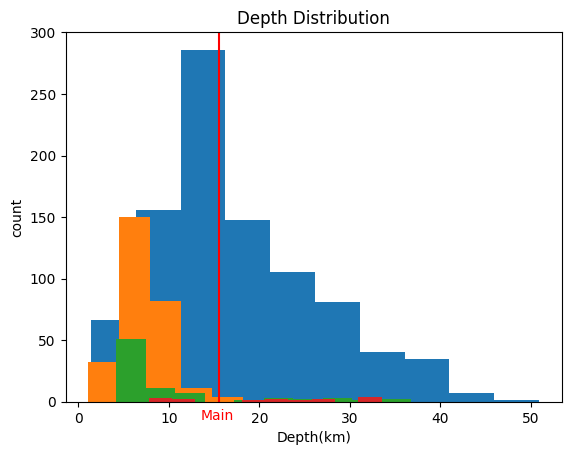

In [33]:
plt.hist(known_series['深度']);
plt.hist(unknown_new_series['深度']);
plt.hist(latest_series['深度']);
plt.hist(twenty_seven['深度'])

plt.title('Depth Distribution')
plt.xlabel('Depth(km)')
plt.ylabel('count')

plt.axvline(x=15.5, color='r')
plt.text(x=13.5, y=-15, s='Main', color='r');

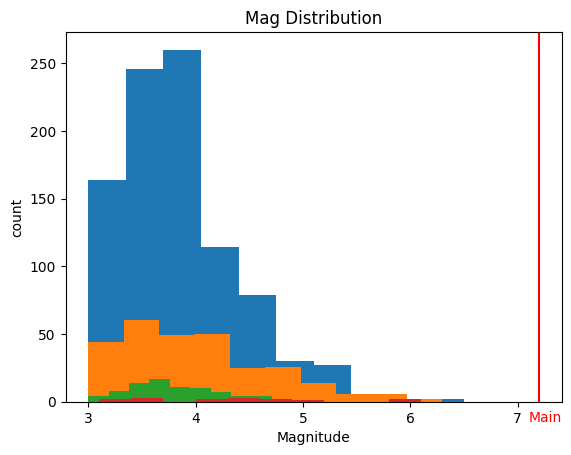

In [34]:
shocks_of_interest=known_series[known_series['經度']>121.0]

plt.hist(shocks_of_interest['規模']);
plt.hist(unknown_new_series['規模']);
plt.hist(latest_series['規模']);
plt.hist(twenty_seven['規模'])


plt.title('Mag Distribution')
plt.xlabel('Magnitude')
plt.ylabel('count')

plt.axvline(x=7.2, color='r')
plt.text(x=7.1, y=-15, s='Main', color='r');

#main_quake: 0403 7.2 主震

#shocks of interest: 0403系列餘震（經度>121.0）

#sub_main_quake: 0422 6.0 主震

#sub_main_sub: 0422 6.2 次主震

#unknown_new_series: 4/22系列群震

#latest_series: 4/24(含)之後

#risk_signals: 海溝區地震

In [41]:
twenty_seven_main=twenty_seven[twenty_seven['規模']==6.1]
twenty_seven.drop(twenty_seven_main.index)

,編號,地震時間,經度,緯度,規模,深度,位置
14,小區域有感地震,2024-04-27 00:24:10,121.571,23.8388,3.4,7.8,花蓮縣政府南南西方 17.6 公里 (位於花蓮縣壽豐鄉)(花蓮縣壽豐鄉)
13,小區域有感地震,2024-04-27 01:05:47,121.737,24.2242,3.1,12.9,花蓮縣政府北北東方 28.4 公里 (位於花蓮縣近海)(花蓮縣近海)
12,小區域有感地震,2024-04-27 02:11:05,121.739,24.2285,3.1,10.7,花蓮縣政府北北東方 29.0 公里 (位於花蓮縣近海)(花蓮縣近海)
10,小區域有感地震,2024-04-27 02:32:57,121.676,24.1878,4.0,32.5,花蓮縣政府北北東方 22.5 公里 (位於花蓮縣近海)(花蓮縣近海)
9,352,2024-04-27 02:45:04,121.648,24.2007,4.7,33.2,花蓮縣政府北方 23.4 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
8,353,2024-04-27 02:49:29,121.689,24.2540,5.8,18.9,花蓮縣政府北北東方 29.9 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
7,小區域有感地震,2024-04-27 02:50:33,121.694,24.2620,4.3,26.2,花蓮縣政府北北東方 31.0 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
6,354,2024-04-27 02:56:10,121.684,24.2527,4.5,28.3,花蓮縣政府北北東方 29.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
5,355,2024-04-27 03:13:28,121.664,24.2087,5.0,21.9,花蓮縣政府北北東方 24.5 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)
4,小區域有感地震,2024-04-27 03:50:40,121.644,24.1855,3.5,33.5,花蓮縣政府北方 21.7 公里 (位於花蓮縣秀林鄉)(花蓮縣秀林鄉)


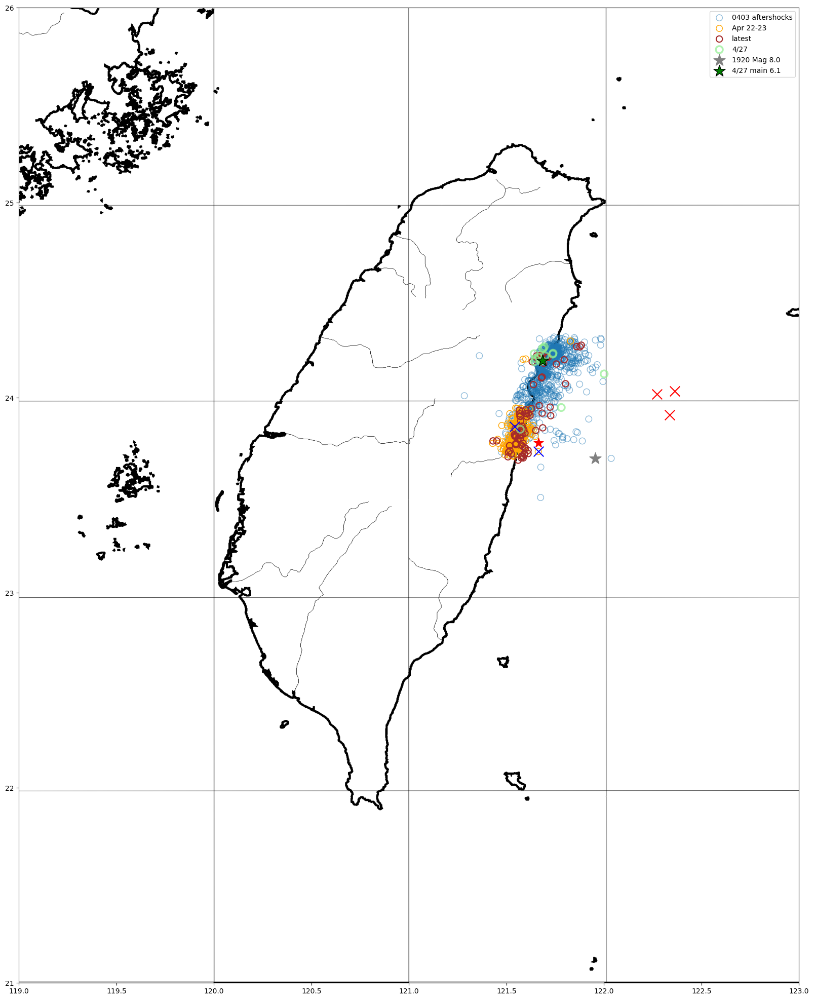

In [45]:
import matplotlib.image as mpimg

image = mpimg.imread('taiwan_on_grid.png')

plt.figure(figsize=(25,25))

# Show the image (with extent to define the bounds)
plt.imshow(image, extent=[119, 123, 21, 26])

# Now you can plot your data on top of the image
plt.scatter(known_series['經度'], known_series['緯度'], edgecolors='#1f77b4', facecolors='none',  alpha=0.5, s=80, label='0403 aftershocks') 
plt.scatter(unknown_new_series['經度'], unknown_new_series['緯度'], edgecolors='orange', facecolors='none', label='Apr 22-23', s=80)

plt.scatter(latest_series['經度'],latest_series['緯度'], edgecolors='brown',  facecolors='none', label='latest', s=80, lw=1.5)
plt.scatter(twenty_seven['經度'],twenty_seven['緯度'], edgecolors='lightgreen', facecolors='none', alpha=0.7,s=100, label='4/27',lw=2.5)
                
plt.scatter(main_quake['經度'], main_quake['緯度'], marker='*', color='r',alpha=1,s=200)
plt.scatter(sub_main_quake['經度'], sub_main_quake['緯度'], marker='x', color='b',alpha=1,s=200)
plt.scatter(sub_main_sub['經度'],sub_main_sub['緯度'], marker='x', color='b',alpha=1,s=200)
plt.scatter(121.954, 23.688, color='gray', marker='*', s=300 , label='1920 Mag 8.0')
plt.scatter(twenty_seven_main['經度'], twenty_seven_main['緯度'],facecolors='green',edgecolors='black', marker='*', s=300 , label='4/27 main 6.1')

plt.scatter(risk_signals['經度'], risk_signals['緯度'], marker='x', color='red',alpha=1,s=200)
plt.legend()
plt.show()

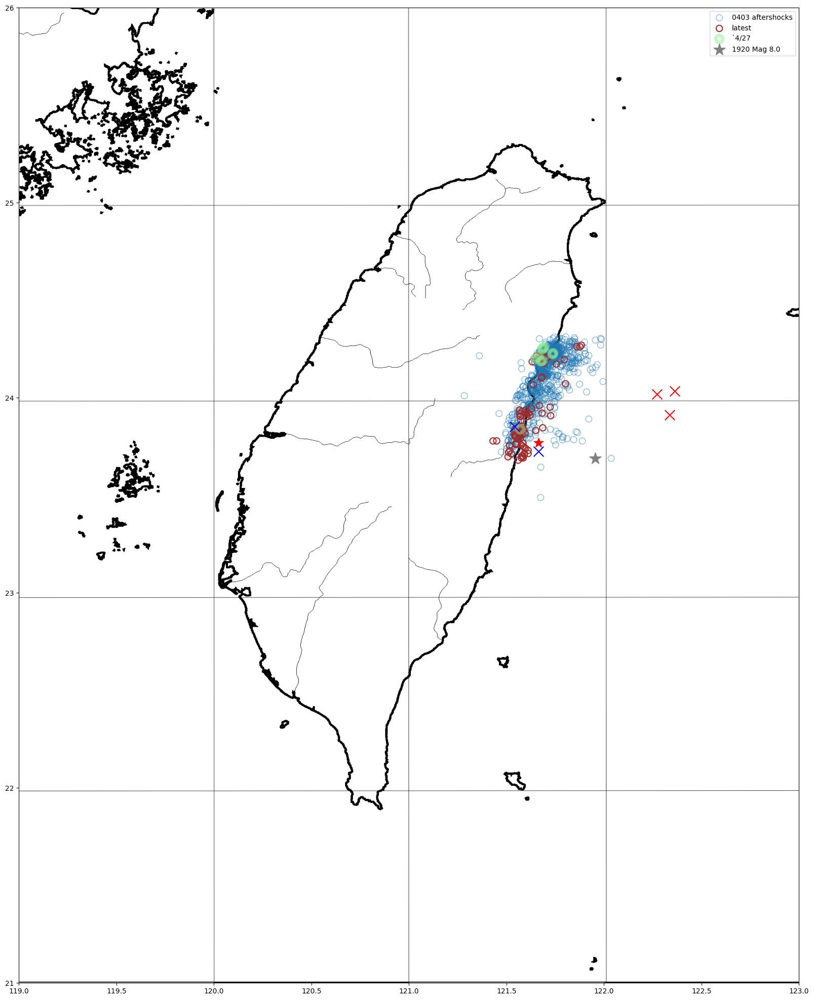

In [23]:
import matplotlib.image as mpimg

image = mpimg.imread('taiwan_on_grid.png')

plt.figure(figsize=(25,25))

# Show the image (with extent to define the bounds)
plt.imshow(image, extent=[119, 123, 21, 26])

# Now you can plot your data on top of the image
plt.scatter(shocks_of_interest['經度'], shocks_of_interest['緯度'], edgecolors='#1f77b4', facecolors='none',  alpha=0.5, s=80, label='0403 aftershocks') 
#plt.scatter(unknown_new_series['經度'], unknown_new_series['緯度'], edgecolors='orange', facecolors='none', label='Apr 22-23', s=80)

plt.scatter(latest_series['經度'],latest_series['緯度'], edgecolors='brown',  facecolors='none', label='latest', s=80, lw=1.5)
plt.scatter(twenty_seven['經度'],twenty_seven['緯度'], edgecolors='lightgreen', facecolors='none', alpha=0.5,s=100, label='4/27',lw=5)


plt.scatter(main_quake['經度'], main_quake['緯度'], marker='*', color='r',alpha=1,s=200)
plt.scatter(sub_main_quake['經度'], sub_main_quake['緯度'], marker='x', color='b',alpha=1,s=200)
plt.scatter(sub_main_sub['經度'],sub_main_sub['緯度'], marker='x', color='b',alpha=1,s=200)
plt.scatter(121.954, 23.688, color='gray', marker='*', s=300 , label='1920 Mag 8.0')

plt.scatter(risk_signals['經度'], risk_signals['緯度'], marker='x', color='red',alpha=1,s=200)
plt.legend()
plt.show()

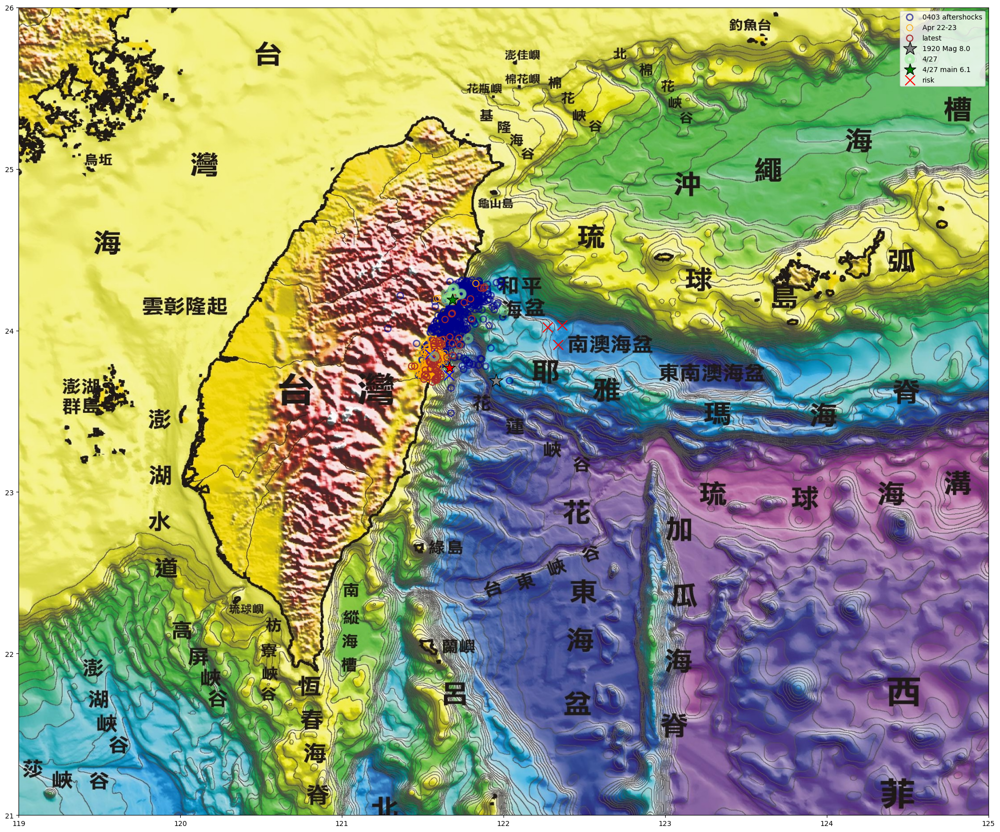

In [47]:
image = mpimg.imread('6441231253106.jpeg')

plt.figure(figsize=(25,25))

# Show the image (with extent to define the bounds)
plt.imshow(image, extent=[119, 125, 21, 26])

# Now you can plot your data on top of the image
plt.scatter(known_series['經度'], known_series['緯度'], edgecolors='darkblue', facecolors='none',  alpha=0.65, s=80, label='0403 aftershocks', lw=2) 
plt.scatter(unknown_new_series['經度'], unknown_new_series['緯度'], edgecolors='orange', facecolors='none', label='Apr 22-23', s=80)

plt.scatter(latest_series['經度'],latest_series['緯度'], edgecolors='brown',  facecolors='none', label='latest', s=80, lw=1.5)

plt.scatter(main_quake['經度'], main_quake['緯度'], marker='*', color='r',alpha=1,s=300, edgecolors='black')
plt.scatter(sub_main_quake['經度'], sub_main_quake['緯度'], marker='x', color='b',alpha=1,s=200)
plt.scatter(sub_main_sub['經度'],sub_main_sub['緯度'], marker='x', color='b',alpha=1,s=200)
plt.scatter(121.954, 23.688, color='gray', marker='*', s=400 , label='1920 Mag 8.0', edgecolors='black')

plt.scatter(twenty_seven['經度'],twenty_seven['緯度'], edgecolors='lightgreen', facecolors='none', alpha=0.5,s=100, label='4/27',lw=5)
plt.scatter(twenty_seven_main['經度'], twenty_seven_main['緯度'],facecolors='green',edgecolors='black', marker='*', s=300 , label='4/27 main 6.1')


plt.scatter(risk_signals['經度'], risk_signals['緯度'], marker='x', color='red',alpha=1,s=200, label='risk')
plt.legend()
plt.show()

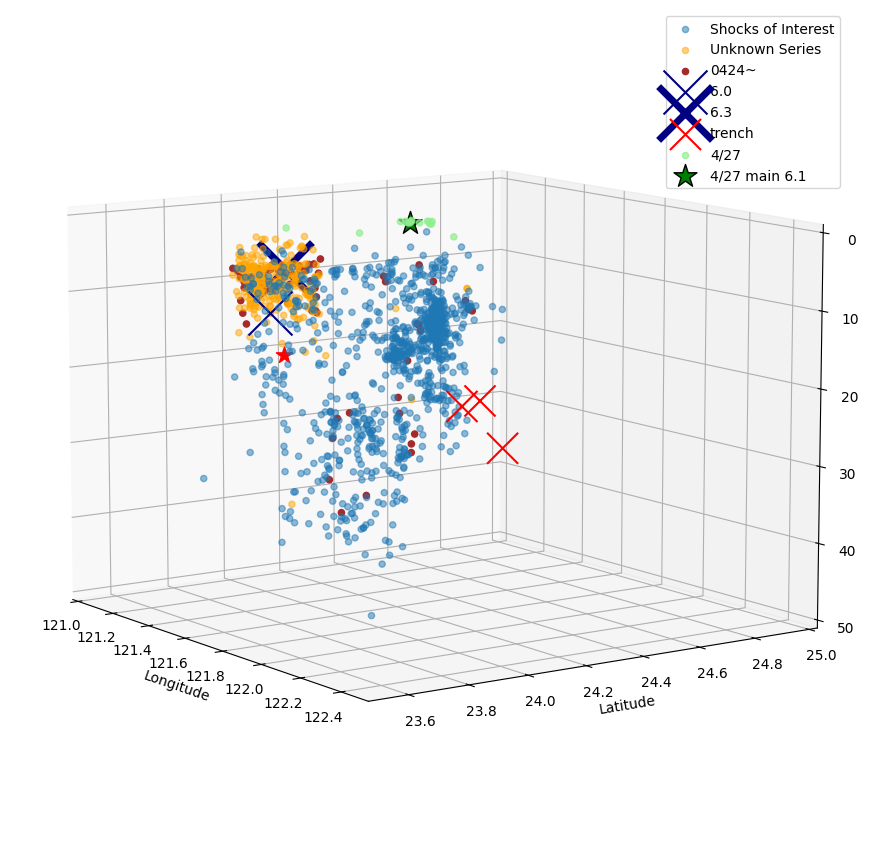

In [56]:
%matplotlib inline
fig = plt.figure(figsize=(50, 50))
ax = fig.add_subplot(411, projection='3d')

# Using the 'Date_MMDD' column for the z-axis
ax.scatter(shocks_of_interest['經度'], shocks_of_interest['緯度'], shocks_of_interest['深度'], alpha=0.5, label='Shocks of Interest')
ax.scatter(unknown_new_series['經度'], unknown_new_series['緯度'], unknown_new_series['深度'], alpha=0.5, color='orange', label='Unknown Series')
ax.scatter(latest_series['經度'],latest_series['緯度'], latest_series['深度'], alpha=1, color='brown',label='0424~')
ax.scatter(main_quake['經度'], main_quake['緯度'], main_quake['深度'], marker='*', color='red', s=150, alpha=1)

ax.scatter(sub_main_quake['經度'], sub_main_quake['緯度'],sub_main_quake['深度'], color='navy', marker='x', s=1000, label='6.0', alpha=1)
ax.scatter(sub_main_sub['經度'], sub_main_sub['緯度'], sub_main_sub['深度'], color='navy', marker='x', s=1500, label='6.3', alpha=1, lw=5)
ax.scatter(risk_signals['經度'],risk_signals['緯度'], risk_signals['深度'],  color='red', marker='x', s=500, label='trench', alpha=1)

ax.scatter(twenty_seven['經度'],twenty_seven['緯度'],c='lightgreen', alpha=0.7,s=20, label='4/27')
ax.scatter(twenty_seven_main['經度'], twenty_seven_main['緯度'],facecolors='green',edgecolors='black', marker='*', s=300 , label='4/27 main 6.1')

# Setting labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (km)')
ax.set_zlim(50,0)
ax.set_xlim(121,122.5)
ax.set_ylim(23.5,25)

ax.view_init(elev=10., azim=-35)

ax.legend()

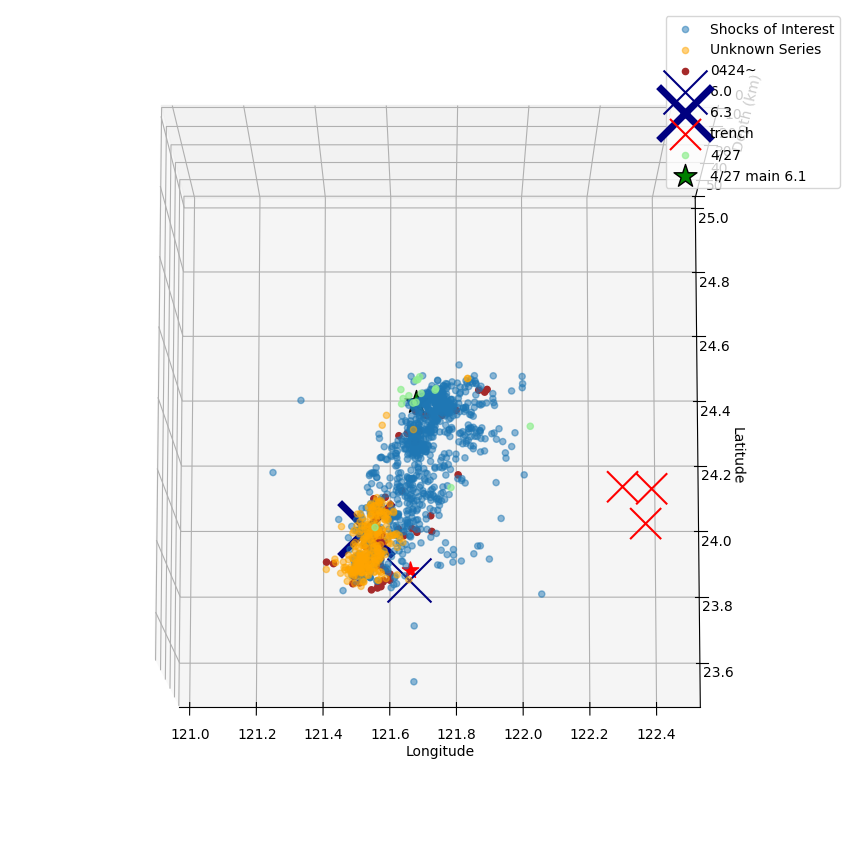

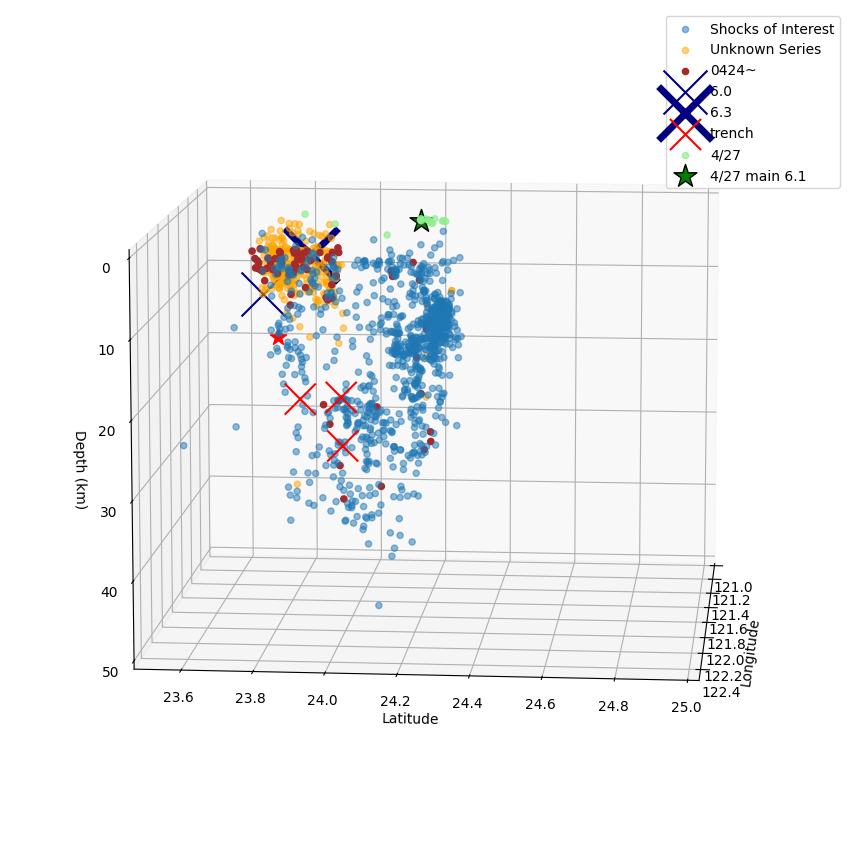

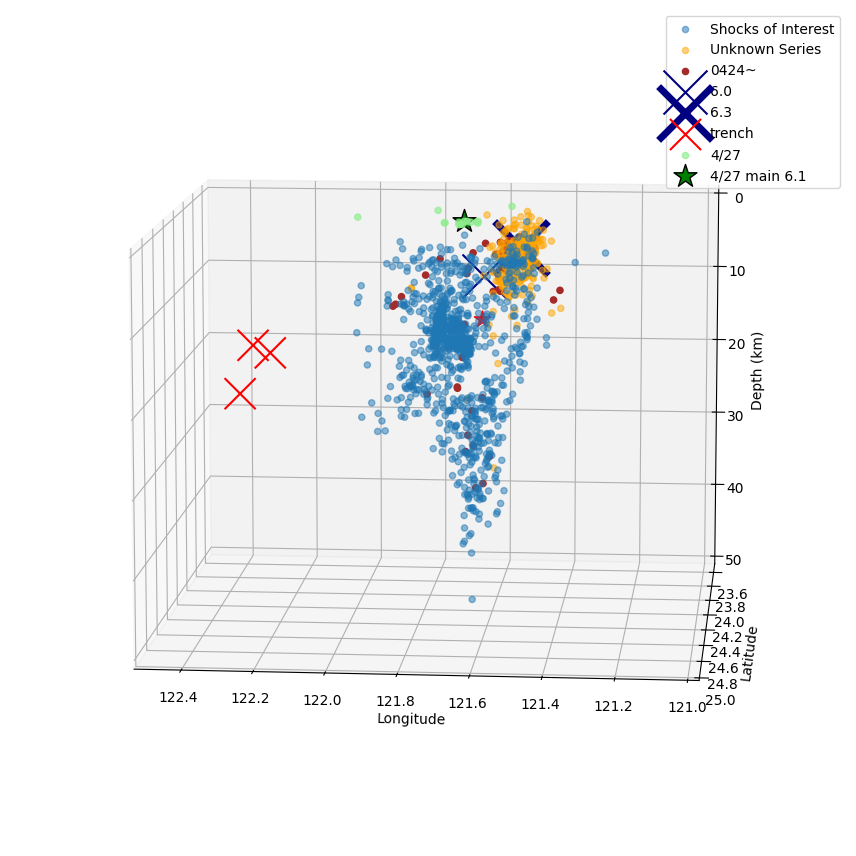

In [57]:
fig = plt.figure(figsize=(50, 50))
ax = fig.add_subplot(411, projection='3d')

# Using the 'Date_MMDD' column for the z-axis
ax.scatter(shocks_of_interest['經度'], shocks_of_interest['緯度'], shocks_of_interest['深度'], alpha=0.5, label='Shocks of Interest')
ax.scatter(unknown_new_series['經度'], unknown_new_series['緯度'], unknown_new_series['深度'], alpha=0.5, color='orange', label='Unknown Series')
ax.scatter(latest_series['經度'],latest_series['緯度'], latest_series['深度'], color='brown',alpha=1, label='0424~')
ax.scatter(main_quake['經度'], main_quake['緯度'], main_quake['深度'], marker='*', color='red', s=150, alpha=1)

ax.scatter(sub_main_quake['經度'], sub_main_quake['緯度'],sub_main_quake['深度'], color='navy', marker='x', s=1000, label='6.0', alpha=1)
ax.scatter(sub_main_sub['經度'], sub_main_sub['緯度'], sub_main_sub['深度'], color='navy', marker='x', s=1500, label='6.3', alpha=1, lw=5)
ax.scatter(risk_signals['經度'],risk_signals['緯度'], risk_signals['深度'],  color='red', marker='x', s=500, label='trench', alpha=1)

ax.scatter(twenty_seven['經度'],twenty_seven['緯度'],c='lightgreen', alpha=0.7,s=20, label='4/27')
ax.scatter(twenty_seven_main['經度'], twenty_seven_main['緯度'],facecolors='green',edgecolors='black', marker='*', s=300 , label='4/27 main 6.1')

# Setting labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (km)')
ax.set_zlim(50,0)
ax.set_xlim(121,122.5)
ax.set_ylim(23.5,25)

ax.view_init(elev=80., azim=-90)

ax.legend()

fig = plt.figure(figsize=(50, 50))
ax = fig.add_subplot(411, projection='3d')

# Using the 'Date_MMDD' column for the z-axis
ax.scatter(shocks_of_interest['經度'], shocks_of_interest['緯度'], shocks_of_interest['深度'], alpha=0.5, label='Shocks of Interest')
ax.scatter(unknown_new_series['經度'], unknown_new_series['緯度'], unknown_new_series['深度'], alpha=0.5, color='orange', label='Unknown Series')
ax.scatter(latest_series['經度'],latest_series['緯度'], latest_series['深度'], color='brown',alpha=1, label='0424~')
ax.scatter(main_quake['經度'], main_quake['緯度'], main_quake['深度'], marker='*', color='red', s=150, alpha=1)

ax.scatter(sub_main_quake['經度'], sub_main_quake['緯度'],sub_main_quake['深度'], color='navy', marker='x', s=1000, label='6.0', alpha=1)
ax.scatter(sub_main_sub['經度'], sub_main_sub['緯度'], sub_main_sub['深度'], color='navy', marker='x', s=1500, label='6.3', alpha=1, lw=5)
ax.scatter(risk_signals['經度'],risk_signals['緯度'], risk_signals['深度'],  color='red', marker='x', s=500, label='trench', alpha=1)

ax.scatter(twenty_seven['經度'],twenty_seven['緯度'],c='lightgreen', alpha=0.7,s=20, label='4/27')
ax.scatter(twenty_seven_main['經度'], twenty_seven_main['緯度'],facecolors='green',edgecolors='black', marker='*', s=300 , label='4/27 main 6.1')

# Setting labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (km)')
ax.set_zlim(50,0)
ax.set_xlim(121,122.5)
ax.set_ylim(23.5,25)

ax.view_init(elev=10., azim=5)

ax.legend()

fig = plt.figure(figsize=(50, 50))
ax = fig.add_subplot(411, projection='3d')

# Using the 'Date_MMDD' column for the z-axis
ax.scatter(shocks_of_interest['經度'], shocks_of_interest['緯度'], shocks_of_interest['深度'], alpha=0.5, label='Shocks of Interest')
ax.scatter(unknown_new_series['經度'], unknown_new_series['緯度'], unknown_new_series['深度'], alpha=0.5, color='orange', label='Unknown Series')
ax.scatter(latest_series['經度'],latest_series['緯度'], latest_series['深度'], color='brown',alpha=1, label='0424~')
ax.scatter(main_quake['經度'], main_quake['緯度'], main_quake['深度'], marker='*', color='red', s=150, alpha=1)

ax.scatter(sub_main_quake['經度'], sub_main_quake['緯度'],sub_main_quake['深度'], color='navy', marker='x', s=1000, label='6.0', alpha=1)
ax.scatter(sub_main_sub['經度'], sub_main_sub['緯度'], sub_main_sub['深度'], color='navy', marker='x', s=1500, label='6.3', alpha=1, lw=5)
ax.scatter(risk_signals['經度'],risk_signals['緯度'], risk_signals['深度'],  color='red', marker='x', s=500, label='trench', alpha=1)

ax.scatter(twenty_seven['經度'],twenty_seven['緯度'],c='lightgreen', alpha=0.7,s=20, label='4/27')
ax.scatter(twenty_seven_main['經度'], twenty_seven_main['緯度'],facecolors='green',edgecolors='black', marker='*', s=300 , label='4/27 main 6.1')

# Setting labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (km)')
ax.set_zlim(50,0)
ax.set_xlim(121,122.5)
ax.set_ylim(23.5,25)

ax.view_init(elev=10., azim=95)

ax.legend()

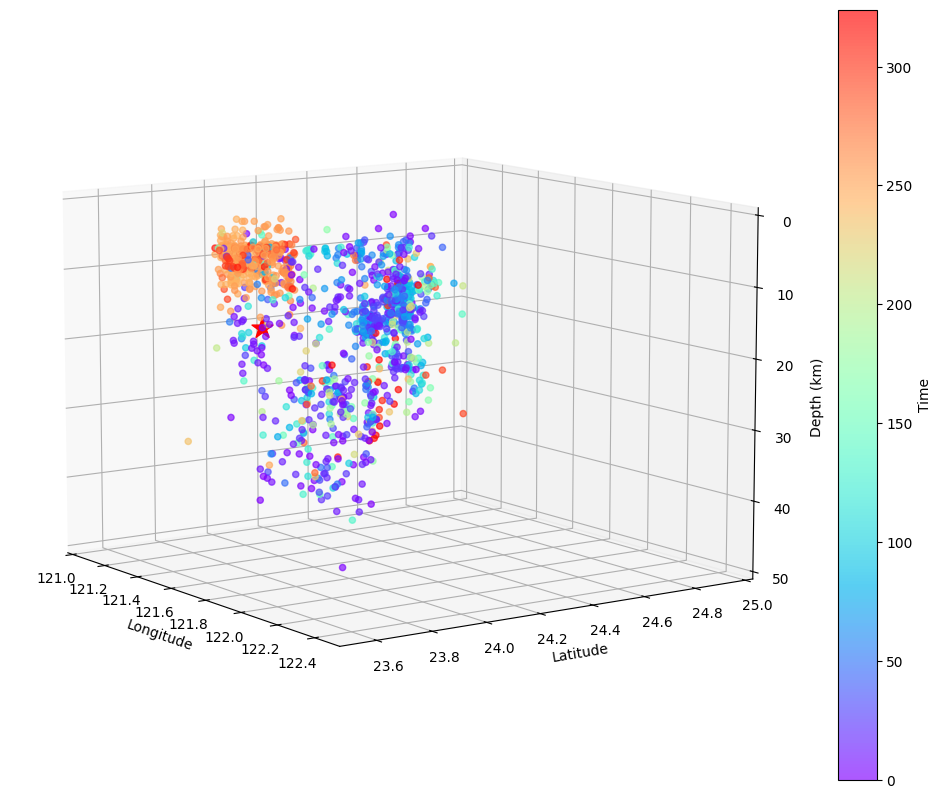

In [58]:
earthquake_data_df['Date_MMDD'] = earthquake_data_df['地震時間'].dt.strftime('%m%d%H').astype('category')
colors=earthquake_data_df['Date_MMDD'].cat.codes

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Using the 'Date_MMDD' column for the z-axis
sc=ax.scatter(earthquake_data_df['經度'], earthquake_data_df['緯度'], earthquake_data_df['深度'], alpha=0.65, c=colors, cmap='rainbow')
ax.scatter(main_quake['經度'], main_quake['緯度'], main_quake['深度'], marker='*', color='red', s=250, alpha=1)
# Setting labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (km)')
ax.set_zlim(50,0)
ax.set_xlim(121,122.5)
ax.set_ylim(23.5,25)

cbar = plt.colorbar(sc)
cbar.set_label('Time')


ax.view_init(elev=10., azim=-35)
plt.show();

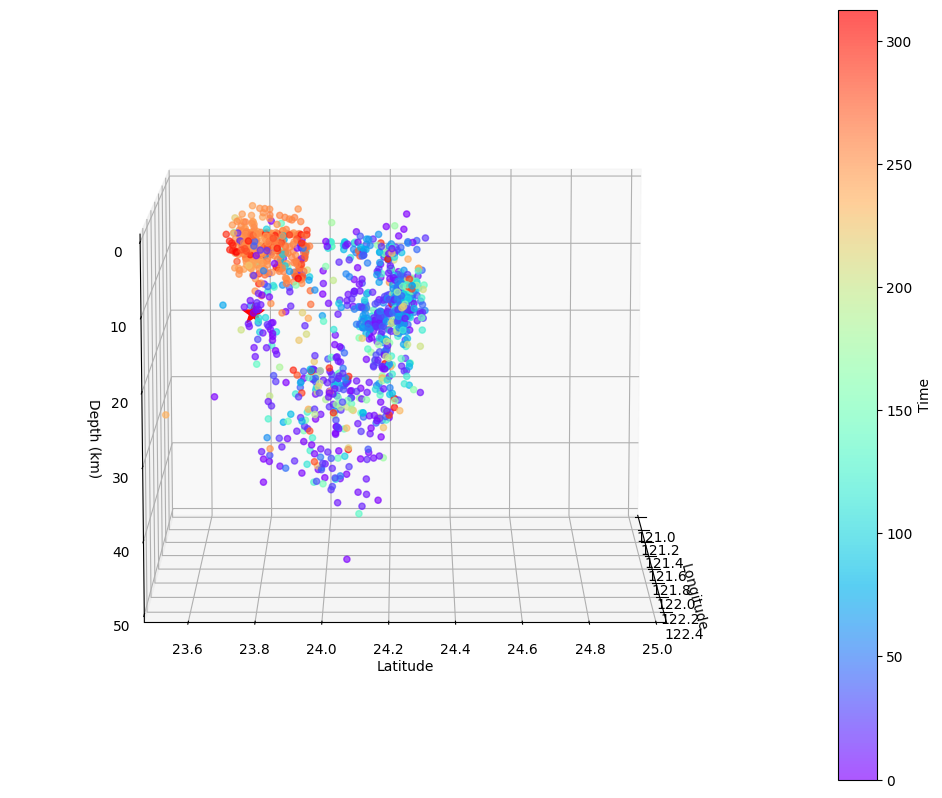

In [74]:
earthquake_data_df['Date_MMDD'] = earthquake_data_df['地震時間'].dt.strftime('%m%d%H').astype('category')
colors=earthquake_data_df['Date_MMDD'].cat.codes

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Using the 'Date_MMDD' column for the z-axis
sc=ax.scatter(earthquake_data_df['經度'], earthquake_data_df['緯度'], earthquake_data_df['深度'], alpha=0.65, c=colors, cmap='rainbow')
ax.scatter(main_quake['經度'], main_quake['緯度'], main_quake['深度'], marker='*', color='red', s=250, alpha=1)
# Setting labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (km)')
ax.set_zlim(50,0)
ax.set_xlim(121,122.5)
ax.set_ylim(23.5,25)

cbar = plt.colorbar(sc)
cbar.set_label('Time')


ax.view_init(elev=10., azim=0)
plt.show();

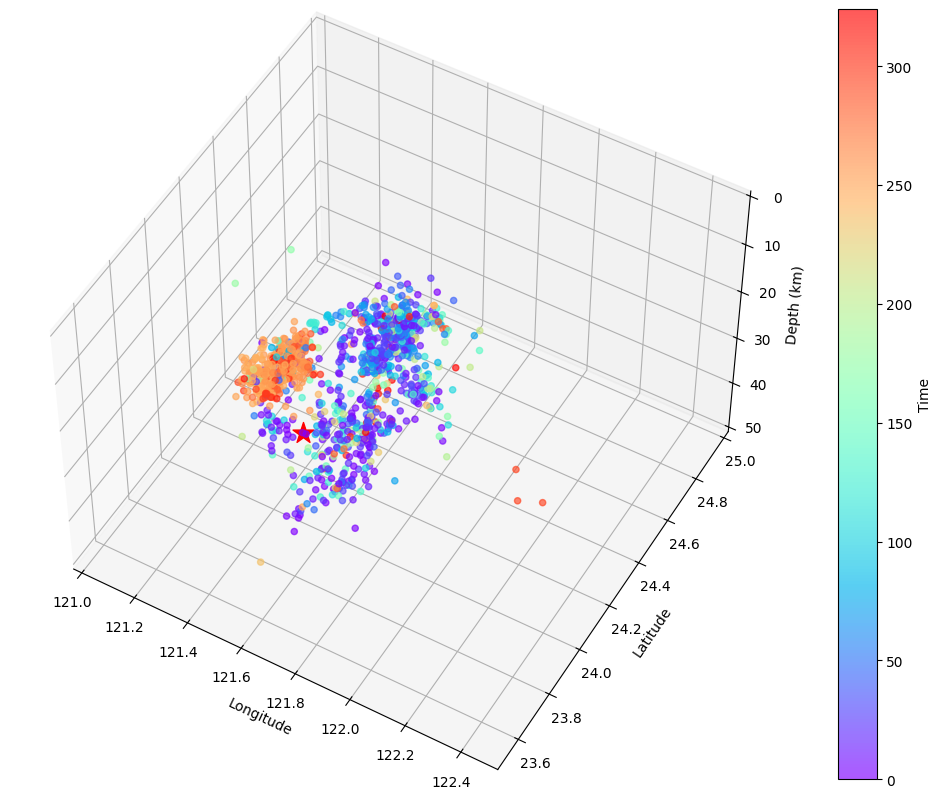

In [59]:
earthquake_data_df['Date_MMDD'] = earthquake_data_df['地震時間'].dt.strftime('%m%d%H').astype('category')
colors=earthquake_data_df['Date_MMDD'].cat.codes

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Using the 'Date_MMDD' column for the z-axis
sc=ax.scatter(earthquake_data_df['經度'], earthquake_data_df['緯度'], earthquake_data_df['深度'], alpha=0.65, c=colors, cmap='rainbow')
ax.scatter(main_quake['經度'], main_quake['緯度'], main_quake['深度'], marker='*', color='red', s=250, alpha=1)
# Setting labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Depth (km)')
ax.set_zlim(50,0)
ax.set_xlim(121,122.5)
ax.set_ylim(23.5,25)

cbar = plt.colorbar(sc)
cbar.set_label('Time')


ax.view_init(elev=50., azim=-60)
plt.show();